In [233]:
import torch
from torch_geometric.data import InMemoryDataset, download_url
import pandas as pd

from torch_geometric.data import Data
from torch_geometric.loader import DataLoader

import numpy as np
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
import matplotlib.pyplot as plt

In [234]:
edges = pd.read_csv("../data/interim/edges.csv")

In [235]:
emb_vis = pd.read_csv("../data/interim/embedding_visium_scvi.csv", index_col = 0)
emb_rna = pd.read_csv("../data/interim/embedding_rna2vis_scvi.csv", index_col = 0)

In [236]:
all_nodes_graph = set(edges.node1.to_list() + edges.node2.to_list())
all_nodes_emb = set(emb_vis.index).union(set(emb_rna.index))
all_nodes = list(all_nodes_graph.intersection(all_nodes_emb))
node_encoder = {all_nodes[i]:i for i in range(len(all_nodes))}
emb_vis = emb_vis.loc[emb_vis.index.isin(all_nodes)]
emb_rna = emb_rna.loc[emb_rna.index.isin(all_nodes)]

In [237]:
edges = edges[edges.node1.isin(all_nodes)]

In [238]:
edges = edges[edges.node2.isin(all_nodes)]

In [239]:
edges.node1 = edges.node1.map(node_encoder)

In [240]:
edges.node2 = edges.node2.map(node_encoder)

In [241]:
emb_vis = emb_vis.rename(index = node_encoder)
emb_rna = emb_rna.rename(index = node_encoder)

In [242]:
len(all_nodes)

34079

In [243]:
edge_index = torch.tensor([edges.node1,
                           edges.node2], dtype=torch.long)

In [244]:
features = pd.concat([emb_vis, emb_rna])

In [245]:
features = features.sort_index()

In [246]:
x = torch.tensor(features.values , dtype=torch.float)

In [247]:
edges

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
0,0,1275,8053,sc2vis,Myeloid,Macrophage,diploid
1,1,1275,8409,sc2vis,Myeloid,Macrophage,diploid
2,2,1275,31309,sc2vis,Myeloid,Macrophage,diploid
3,3,1275,33808,sc2vis,Myeloid,Macrophage,diploid
4,4,1275,11021,sc2vis,Myeloid,Macrophage,diploid
...,...,...,...,...,...,...,...
310423,318463,27804,30563,vis2grid,NaN,NaN,NaN
310424,318464,27804,21281,vis2grid,NaN,NaN,NaN
310425,318465,27804,19009,vis2grid,NaN,NaN,NaN
310426,318466,23706,9938,vis2grid,NaN,NaN,NaN


In [248]:
edges.clone = edges.clone.fillna("missing")

In [249]:
edges[edges.clone == "missing"]

,Unnamed: 0,node1,node2,type,celltype_major,celltype_minor,clone
290870,298910,26288,15650,vis2grid,NaN,NaN,missing
290871,298911,26288,2336,vis2grid,NaN,NaN,missing
290872,298912,29700,19280,vis2grid,NaN,NaN,missing
290873,298913,29700,28086,vis2grid,NaN,NaN,missing
290874,298914,29700,30127,vis2grid,NaN,NaN,missing
...,...,...,...,...,...,...,...
310423,318463,27804,30563,vis2grid,NaN,NaN,missing
310424,318464,27804,21281,vis2grid,NaN,NaN,missing
310425,318465,27804,19009,vis2grid,NaN,NaN,missing
310426,318466,23706,9938,vis2grid,NaN,NaN,missing


In [250]:
nodes_atr = edges[["node1","type","celltype_major", "clone"]].drop_duplicates()

In [251]:
nodes_atr = nodes_atr.sort_values(by = "node1")

In [252]:
nodes_atr.clone.unique()

array(['6.0', '2.0', '5.0', 'diploid', 'missing', '0.0', '1.0', '4.0',
       '7.0', '3.0', '8.0'], dtype=object)

In [253]:
nodes_atr.celltype_major = nodes_atr.celltype_major.fillna("missing")

In [254]:
nodes_atr

,node1,type,celltype_major,clone
69260,0,sc2vis,Normal Epithelial,6.0
117380,1,sc2vis,Cancer Epithelial,2.0
264490,2,sc2vis,Normal Epithelial,5.0
95760,3,sc2vis,T.cells,diploid
99810,4,sc2vis,T.cells,diploid
...,...,...,...,...
124070,34074,sc2vis,T.cells,diploid
232680,34075,sc2vis,Normal Epithelial,1.0
104980,34076,sc2vis,Cancer Epithelial,2.0
187410,34077,sc2vis,T.cells,diploid


In [255]:
from collections import Counter

Counter(nodes_atr.celltype_major)

Counter({'Normal Epithelial': 4033,
         'Cancer Epithelial': 8503,
         'T.cells': 5983,
         'Myeloid': 3868,
         'CAFs': 2592,
         'missing': 4992,
         'B.cells': 1018,
         'Endothelial': 1346,
         'Plasmablasts': 1275,
         'PVL': 469})

In [256]:
ct_list = list(nodes_atr.celltype_major.unique())
ct_list.remove("missing")

In [257]:
Counter(nodes_atr.clone)

Counter({'6.0': 560,
         '2.0': 1610,
         '5.0': 808,
         'diploid': 18692,
         'missing': 4992,
         '0.0': 2673,
         '1.0': 1953,
         '4.0': 846,
         '7.0': 560,
         '3.0': 923,
         '8.0': 462})

In [258]:
clone_dict = {'missing':-1, '0.0':0, '1.0':1, '2.0':2, '3.0':3, '4.0':4, '5.0':5,'6.0':6,'7.0':7, '8.0':8,'diploid':9}
type_dict = {ct_list[i]:i for i in range(len(ct_list))}

In [259]:
type_dict["missing"] = -1

In [260]:
type_dict

{'Normal Epithelial': 0,
 'Cancer Epithelial': 1,
 'T.cells': 2,
 'Myeloid': 3,
 'CAFs': 4,
 'B.cells': 5,
 'Endothelial': 6,
 'Plasmablasts': 7,
 'PVL': 8,
 'missing': -1}

In [261]:
nodes_atr.clone = nodes_atr.clone.map(clone_dict)

In [262]:
edges.celltype_major = edges.celltype_major.fillna("missing")

In [263]:
nodes_atr.celltype_major = nodes_atr.celltype_major.map(type_dict)

In [264]:
nodes_atr = nodes_atr.set_index("node1")

In [265]:
nodes_atr.head()

,type,celltype_major,clone
node1,,,
0,sc2vis,0,6
1,sc2vis,1,2
2,sc2vis,0,5
3,sc2vis,2,9
4,sc2vis,2,9


In [266]:
features = features.join(nodes_atr)

In [267]:
features.clone = features.clone.fillna(-1)

In [268]:
features.celltype_major = features.celltype_major.fillna(-1)

In [269]:
y_clone = torch.tensor(features.clone.values,dtype=torch.long)


In [270]:
y_type = torch.tensor(features.celltype_major.values,dtype=torch.long)

In [271]:
y_type.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8])

In [272]:
y_clone.unique()

tensor([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9])

In [273]:
data = Data(x=x, edge_index=edge_index, y_clone = y_clone,y_type = y_type, edge_type = edges.type.values)

In [274]:
data.validate(raise_on_error=True)


True

In [275]:
hold_out = torch.tensor(np.where(data.y_clone == -1)[0],dtype=torch.long)

In [276]:
tot_size = data.x.shape[0] -len(hold_out)
train_size = int(0.8*tot_size)
hold_in = np.arange(data.x.shape[0])
hold_in = [x for x in hold_in if x not in  hold_out]

In [277]:
len(hold_out)

4992

In [278]:
data.y_type[hold_in].unique()

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8])

In [279]:
data.y_clone[hold_in].unique()

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [280]:
from sklearn.model_selection import train_test_split

train_samp,test_samp,_,_ = train_test_split(hold_in,data.y_type[hold_in], stratify = data.y_type[hold_in], test_size=0.2, random_state=42)


In [281]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [282]:
data.train_mask = torch.tensor(train_samp,dtype=torch.long)
data.test_mask = torch.tensor(test_samp,dtype=torch.long)
data.hold_out = hold_out

In [283]:
y_train = data.y_type[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_type = 1. / class_sample_count

In [284]:
y_train = data.y_clone[data.train_mask]
class_sample_count = np.array(
    [len(np.where(y_train == t)[0]) for t in np.unique(y_train)])
weight_clone = 1. / class_sample_count

In [285]:
weight_clone = torch.tensor(weight_clone, dtype=torch.float)
weight_type = torch.tensor(weight_type, dtype=torch.float)

In [286]:
data.num_classes_clone = len(y_clone.unique())
data.num_classes_type = len(y_type.unique())

In [287]:



class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = GCNConv(data.num_node_features, 16)
        self.conv2 = GCNConv(16, 16)
        self.conv3 = GCNConv(16, 16)


        # self.conv_clone = GCNConv(16, data.num_classes_clone - 1)
        # self.conv_type = GCNConv(16, data.num_classes_type-1)
        self.out = GCNConv(16,data.num_classes_clone +  data.num_classes_type -2)


    def forward(self, x, edge_index):

        x = self.conv1(x, edge_index)
        x = self.conv2(x, edge_index)
        x = self.conv3(x, edge_index)

        x_pre = F.relu(x)
        # x_pre = F.dropout(x, training=self.training)
        # x_clone = self.conv_clone(x_pre, edge_index)
        # x_type = self.conv_type(x_pre, edge_index)
        x_out = self.out(x_pre, edge_index)


        # return (F.log_softmax(x_clone, dim=1),F.log_softmax(x_type, dim=1))
        return (x_out)

In [288]:
device = torch.device('cpu')
model = GCN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

In [289]:
data = data.to(device)


In [290]:
data.num_classes_clone

11

In [291]:
data.num_classes_type

10

In [292]:
pred = model(data.x, data.edge_index)

In [293]:
pred[:,:data.num_classes_clone-1].shape

torch.Size([34079, 10])

In [294]:
pred[:,data.num_classes_clone-1:].shape

torch.Size([34079, 9])

In [295]:
def test():
    model.eval()
    pred = model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_clone = pred_clone.argmax(dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    pred_cell_type = pred_cell_type.argmax(dim=1)

    correct_clones = (pred_clone[data.test_mask] == data.y_clone[data.test_mask]).sum()
    correct_types = (pred_cell_type[data.test_mask] == data.y_type[data.test_mask]).sum()

    acc_clone = int(correct_clones) / len(data.test_mask)
    acc_type = int(correct_types) / len(data.test_mask)
    # reducer = umap.UMAP()
    # emb = pred[-1].detach().numpy()
    # scaled_penguin_data = StandardScaler().fit_transform(emb)
    # embedding = reducer.fit_transform(scaled_penguin_data)
    # sns.scatterplot(x = embedding[:, 0], y = embedding[:, 1], hue = data.node_type)
    # plt.show()
    return(acc_clone,acc_type)

In [296]:
norm_sim = np.load("../data/interim/clone_dist.npy")

In [297]:
norm_sim

array([[1.        , 0.77439763, 0.52347409, 0.65536178, 0.67280636,
        0.2886319 , 0.55667335, 0.3407461 , 0.63728405, 0.68807904],
       [0.77439763, 1.        , 0.74242655, 0.4584098 , 0.55461467,
        0.50053511, 0.71084537, 0.36084372, 0.68769894, 0.47414725],
       [0.52347409, 0.74242655, 1.        , 0.22386834, 0.35686569,
        0.75008355, 0.76737493, 0.30229049, 0.58914126, 0.230789  ],
       [0.65536178, 0.4584098 , 0.22386834, 1.        , 0.61043814,
        0.        , 0.26825281, 0.21674747, 0.40164371, 0.8468873 ],
       [0.67280636, 0.55461467, 0.35686569, 0.61043814, 1.        ,
        0.15560153, 0.39637728, 0.57303908, 0.49269232, 0.63817448],
       [0.2886319 , 0.50053511, 0.75008355, 0.        , 0.15560153,
        1.        , 0.61256215, 0.19545772, 0.4015273 , 0.00698731],
       [0.55667335, 0.71084537, 0.76737493, 0.26825281, 0.39637728,
        0.61256215, 1.        , 0.31353055, 0.62092473, 0.27508909],
       [0.3407461 , 0.36084372, 0.3022904

In [298]:
def weighted_loss(probabilities, norm_sim, target):
        probabilities = torch.exp(probabilities)
        similarity = torch.tensor(norm_sim[target,:]).to(device)
        level_loss=-torch.log((probabilities * similarity).sum(axis = 1)).sum()
        return(level_loss)

In [299]:
no_improv

1

In [300]:
eps = 1e-4
loss_old = 100
loss_clones = []
loss_types = []
aclones = []
atypes = []
model.train()
no_improv = 0
for epoch in range(300):
    optimizer.zero_grad()
    pred= model(data.x, data.edge_index)
    pred_clone = pred[:,:data.num_classes_clone-1]
    pred_cell_type = pred[:,data.num_classes_clone-1:]
    pred_clone = F.log_softmax(pred_clone, dim=1)
    pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
    # loss_clone = weighted_loss(out_clone[data.train_mask], norm_sim, data.y_clone[data.train_mask])
    loss_clone = F.nll_loss(pred_clone[data.train_mask], data.y_clone[data.train_mask], weight = weight_clone)
    loss_type = F.nll_loss(pred_cell_type[data.train_mask], data.y_type[data.train_mask], weight = weight_type)

    acc_clone, a_ct = test()
    if epoch%20==0:
        print(f"epoch {epoch}: Clone prediction loss {loss_clone.item():.3f},Cell type prediction loss: {loss_type.item():.3f}")
        print(f"TEST: Clone accuracy {acc_clone:.4f}, Cell type accuracy: {a_ct:.4f}")
    aclones.append(acc_clone)
    atypes.append(a_ct)

    loss_clones.append(loss_clone.item())
    loss_types.append(loss_type.item())
    # loss = loss_clone + loss_type
    loss = torch.log(torch.sqrt(loss_clone*loss_type))
    loss.backward()
    optimizer.step()
    if (loss_old- loss_clone.item() <eps):
        no_improv += 1
        print(f"no improvement ({no_improv})")
    else:
        no_improv = 0
    if (no_improv >5) & epoch>100:
        print("EARLY STOPPING")
        break
    loss_old = loss_clone.item()


epoch 0: Clone prediction loss 2.527,Cell type prediction loss: 2.331
TEST: Clone accuracy 0.1996, Cell type accuracy: 0.0603
epoch 20: Clone prediction loss 1.630,Cell type prediction loss: 1.511
TEST: Clone accuracy 0.2570, Cell type accuracy: 0.4945
epoch 40: Clone prediction loss 1.418,Cell type prediction loss: 1.219
TEST: Clone accuracy 0.4469, Cell type accuracy: 0.6672
epoch 60: Clone prediction loss 1.311,Cell type prediction loss: 1.115
TEST: Clone accuracy 0.4366, Cell type accuracy: 0.6934
epoch 80: Clone prediction loss 1.268,Cell type prediction loss: 1.058
TEST: Clone accuracy 0.4105, Cell type accuracy: 0.7198
epoch 100: Clone prediction loss 1.240,Cell type prediction loss: 1.022
TEST: Clone accuracy 0.4182, Cell type accuracy: 0.7305
epoch 120: Clone prediction loss 1.221,Cell type prediction loss: 0.993
TEST: Clone accuracy 0.4156, Cell type accuracy: 0.7472
no improvement (1)
no improvement (2)
epoch 140: Clone prediction loss 1.214,Cell type prediction loss: 0.968


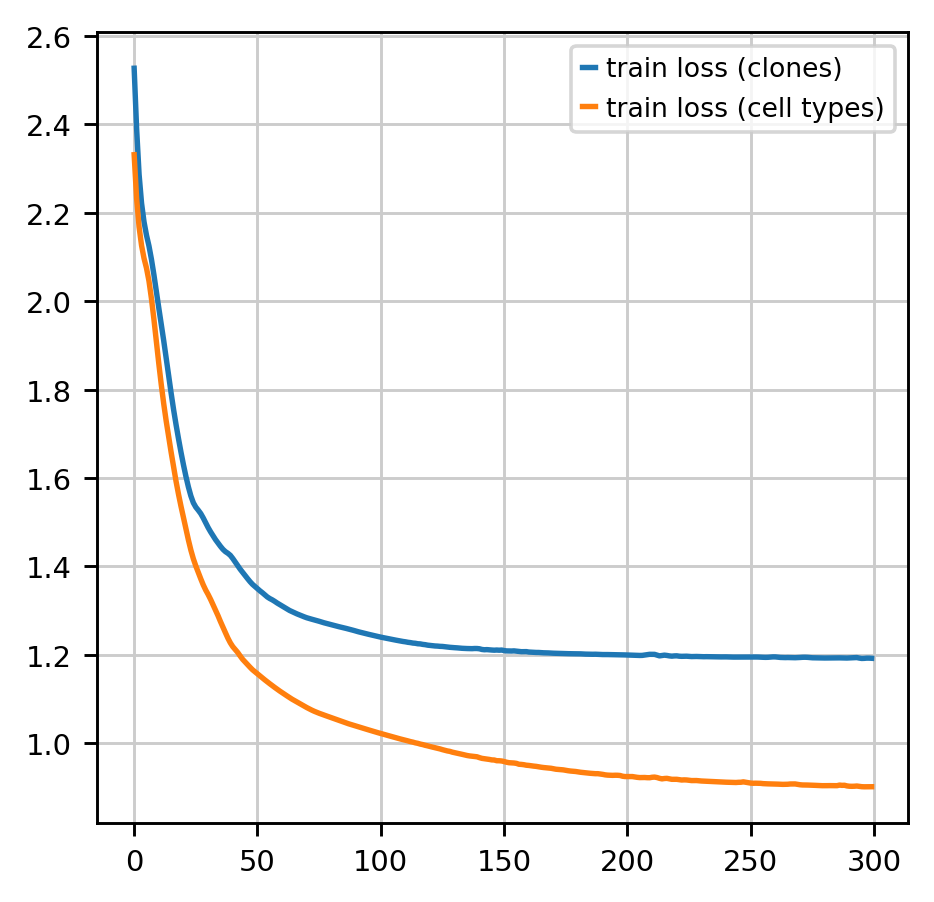

In [301]:
plt.plot(loss_clones, label = "train loss (clones)")
plt.plot(loss_types, label = "train loss (cell types)")
plt.legend()
plt.show()

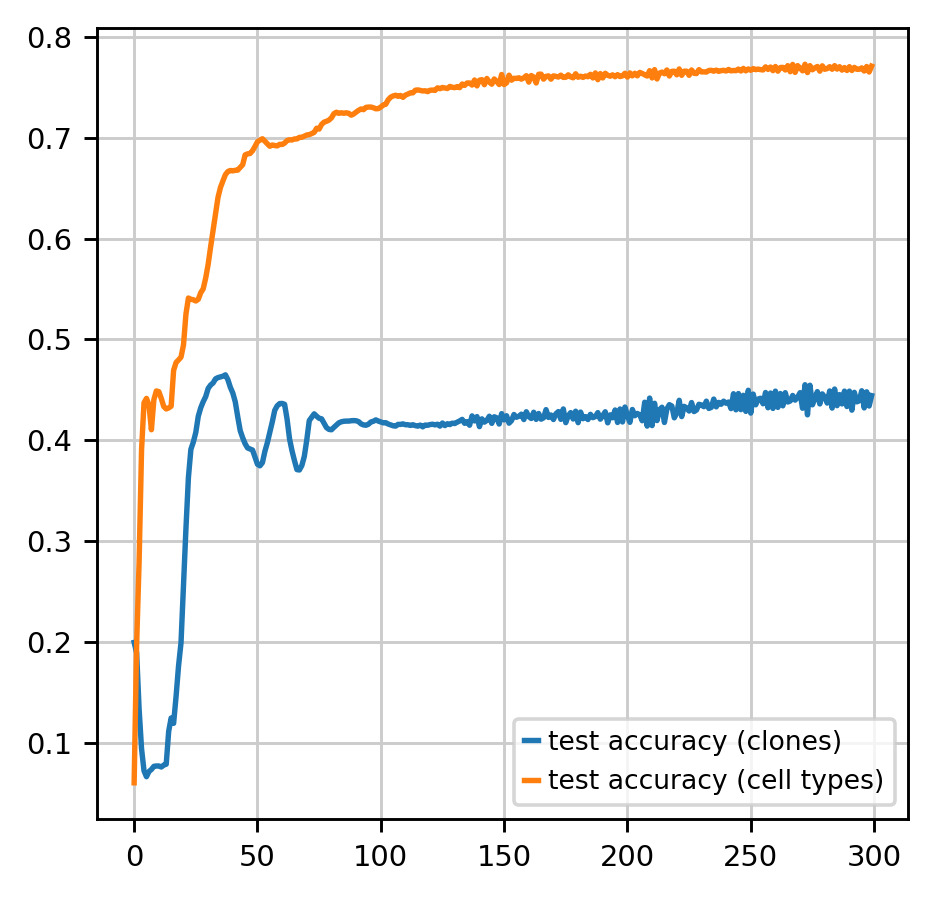

In [302]:
plt.plot(aclones, label = "test accuracy (clones)")
plt.plot(atypes, label = "test accuracy (cell types)")
plt.legend()
plt.show()

In [303]:
from torch_geometric.explain import Explainer, GNNExplainer


In [304]:
# explainer = Explainer(
#     model=model,
#     algorithm=GNNExplainer(epochs=200),
#     explainer_config =dict(
#         explanation_type='model',
#         node_mask_type='attributes',
#         edge_mask_type='object'),
#     model_config=dict(
#         mode='multiclass_classification',
#         task_level='node',
#         return_type='raw',  
#     ),
# )


In [305]:
# explanation = explainer(data.x, data.edge_index, index=10)


In [306]:
# from torch_geometric.explain.metric import fidelity


In [307]:
# explanation

In [308]:
model.eval()
pred = model(data.x, data.edge_index)
pred_clone = pred[:,:data.num_classes_clone-1]
pred_cell_type = pred[:,data.num_classes_clone-1:]
pred_clone = F.log_softmax(pred_clone, dim=1)
pred_clone = pred_clone.argmax(dim=1)
pred_cell_type = F.log_softmax(pred_cell_type, dim=1)
pred_cell_type = pred_cell_type.argmax(dim=1)

correct_clones = (pred_clone[data.test_mask] == data.y_clone[data.test_mask]).sum()
correct_types = (pred_cell_type[data.test_mask] == data.y_type[data.test_mask]).sum()

acc_clone = int(correct_clones) / len(data.test_mask)
acc_type = int(correct_types) / len(data.test_mask)

print(f'Accuracy clones: {acc_clone:.4f}')
print(f'Accuracy cell types: {acc_type:.4f}')

Accuracy clones: 0.4438
Accuracy cell types: 0.7671


In [309]:
clone_rev = {val:key for key,val in clone_dict.items()}
type_rev = {val:key for key,val in type_dict.items()}
node_encoder_rev = {val:key for key,val in node_encoder.items()}

In [323]:
pred = model(data.x, data.edge_index)
pred_clone = pred[:,:data.num_classes_clone-1]
pred_cell_type = pred[:,data.num_classes_clone-1:]
pred_clone = np.exp(F.log_softmax(pred_clone, dim=1).detach().numpy())
pred_cell_type = np.exp(F.log_softmax(pred_cell_type, dim=1).detach().numpy())


In [324]:
cells_hold_out =[node_encoder_rev[x.item()] for x in data.hold_out]

In [325]:
len(cells_hold_out)

4992

In [327]:
clone_res = pd.DataFrame(pred_clone[data.hold_out], index = cells_hold_out)

In [328]:
clone_res.columns = [0, 1, 2, 3, 4, 5, 6, 7, 8, "diploid"]

In [329]:
ct_res = pd.DataFrame(pred_cell_type[data.hold_out], index = cells_hold_out)

In [330]:
ct_res.columns = [type_rev[x] for x in ct_res.columns]

In [331]:
import scanpy as sc


In [332]:
path = "../data/raw/visium/"
visium = sc.read_visium(path, genome=None, count_file='CytAssist_FFPE_Human_Breast_Cancer_filtered_feature_bc_matrix.h5',
                        library_id=None, load_images=True, source_image_path=None)
visium.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [333]:
coor_int = [[int(x[0]),int(x[1])] for x in visium.obsm["spatial"]]
visium.obsm["spatial"] = np.array(coor_int)

In [334]:
clones_columns = clone_res.columns
ct_columns = ct_res.columns

In [335]:
visium.obs = visium.obs.join(clone_res).join(ct_res)

In [336]:
visium.obs["clone"] = visium.obs[clones_columns].idxmax(axis = 1)

In [338]:
visium.obs["cell_type"] = visium.obs[ct_columns].idxmax(axis = 1)

In [339]:
visium.obs["clone"].unique()

array([3, 4, 8, 0, 2, 7, 'diploid', 6, 5, 1], dtype=object)

In [340]:
visium.obs.clone = visium.obs.clone.astype("str")

In [341]:
colors = {'8': (0.8941176470588236, 0.10196078431372549, 0.10980392156862745),
 '4': (0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
 '1': (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
 '7': (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
 '6': (1.0, 0.4980392156862745, 0.0),
 '5': (1.0, 1.0, 0.2),
 '2': (0.6509803921568628, 0.33725490196078434, 0.1568627450980392),
 '3': (0.9686274509803922, 0.5058823529411764, 0.7490196078431373),
 '0': (0.6, 0.6, 0.6),
 'diploid': '#aec7e8'}

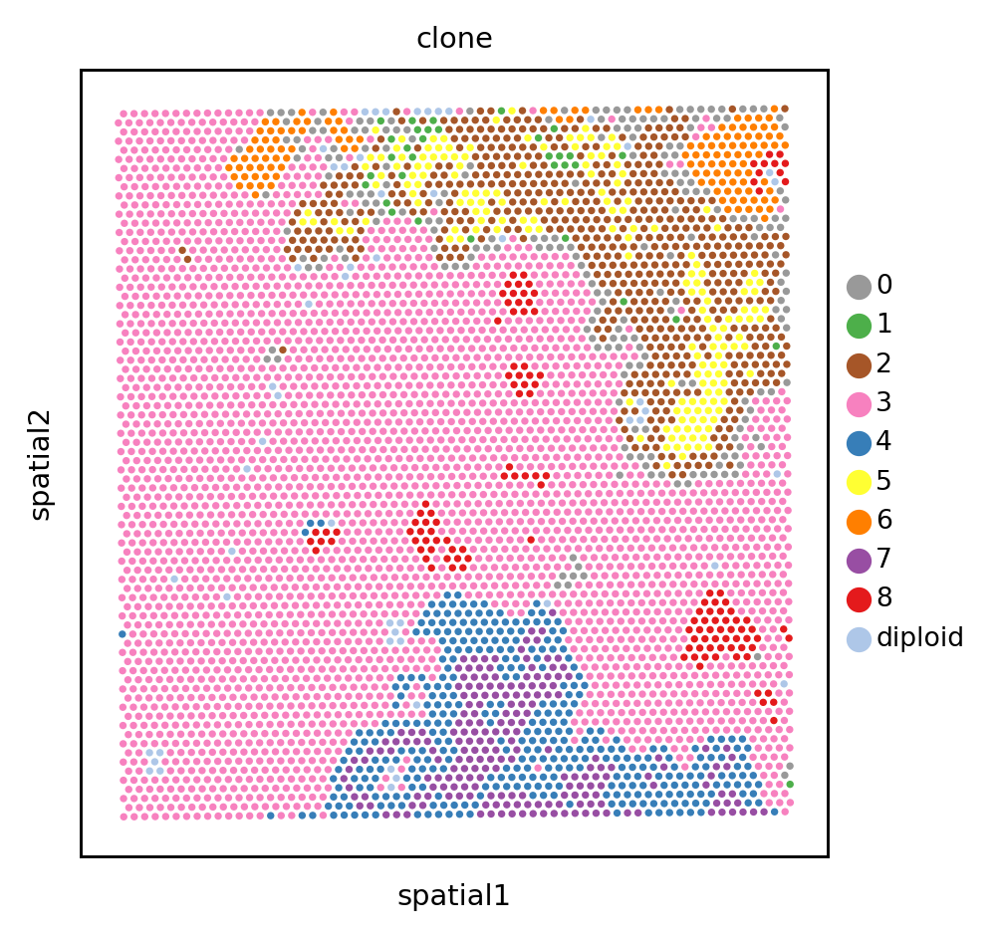

In [342]:
sc.set_figure_params(dpi = 130, scanpy=True, fontsize=8)
sc.pl.spatial(visium, color="clone",alpha = 1, bw = False, alpha_img = 0,
             palette = colors)

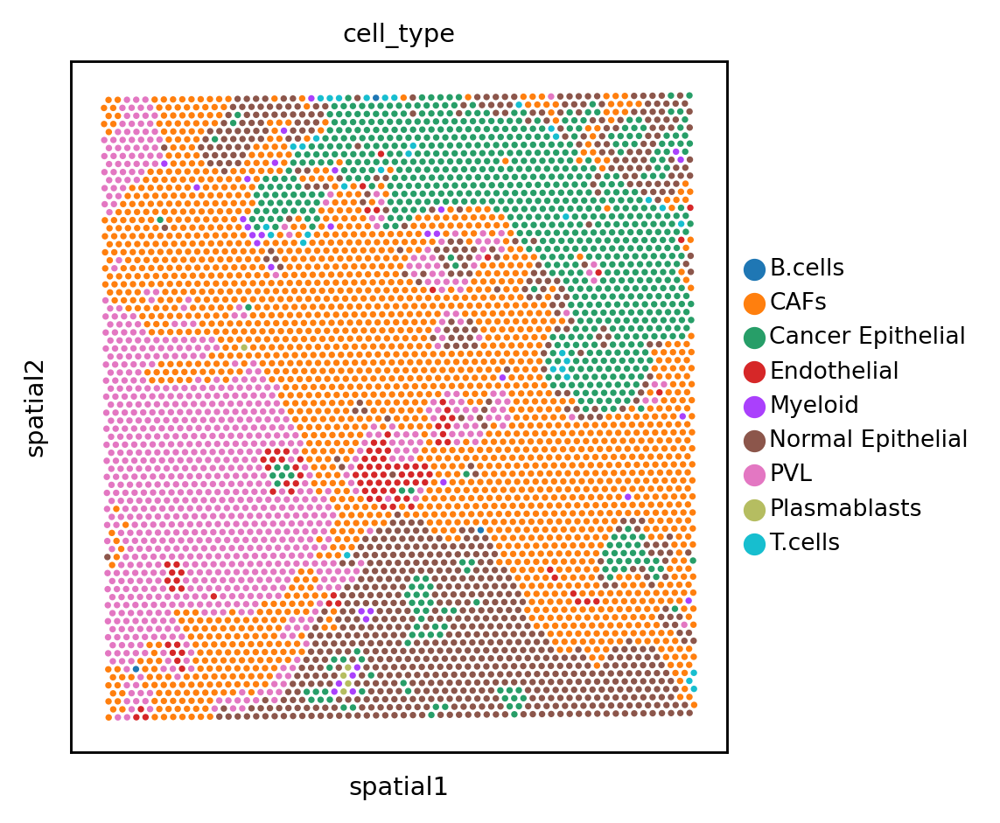

In [345]:
sc.set_figure_params(dpi = 130, scanpy=True, fontsize=8)
sc.pl.spatial(visium, color="cell_type",alpha = 1, bw = False, alpha_img = 0)

In [346]:
import matplotlib as mpl


In [350]:
import os
os.listdir("../reports/figures/")

['.gitkeep']

In [354]:
import seaborn as sns
sns.set(font_scale=2)

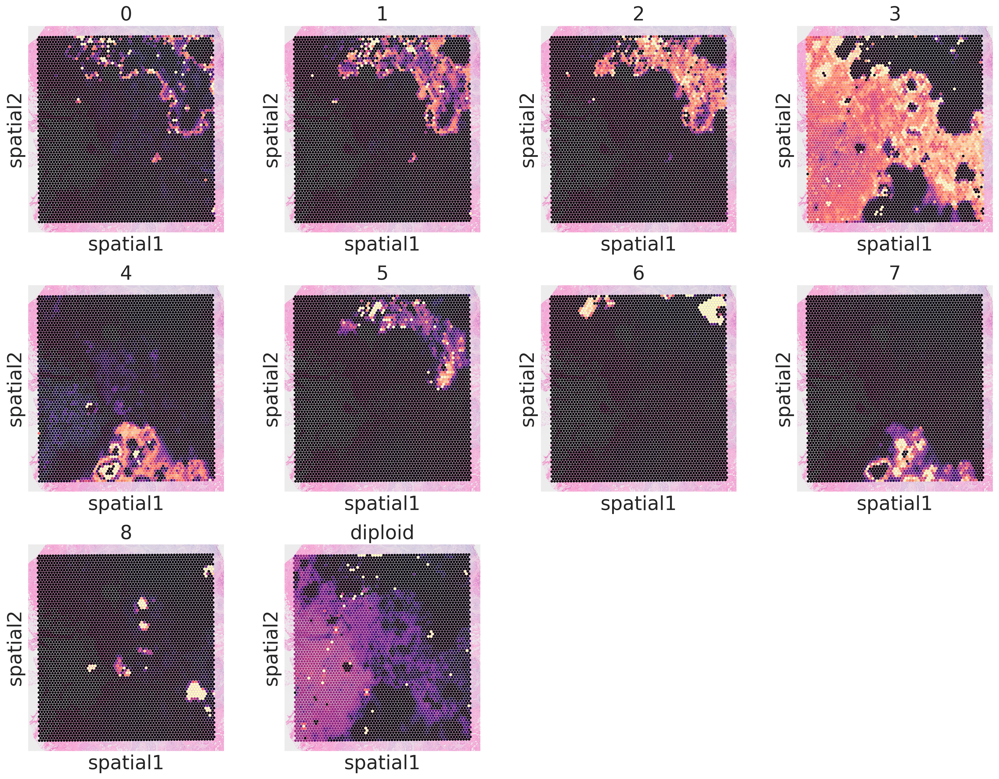

In [357]:
with mpl.rc_context({'axes.facecolor':  'black',
                     'figure.figsize': [4.5, 5]}):

    sc.pl.spatial(visium, cmap='magma',
                  # show first 8 cell types
                  color=clones_columns,
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  vmin=0, vmax='p99.2',
                  colorbar_loc = None
                 )


In [231]:
visium.obs.columns = [str(x) for x in visium.obs.columns]

In [232]:
visium.write("../data/interim/visium_annotated.h5ad")

